In [14]:
import librosa
import os
import matplotlib.pyplot as plt
from pydub import AudioSegment
from pydub.silence import split_on_silence
import IPython.display as ipd
import numpy as np
import librosa.display as ld
from scipy.signal import butter, filtfilt
import soundfile
import time
import pandas as pd

In [2]:
import nemo.collections.asr as nemo_asr
import torch

[NeMo W 2024-05-10 23:15:08 nemo_logging:393] Could not import NeMo NLP collection which is required for speech translation model.


Краткое введение

В данной работе, будет проведен предварительный анализ данных и построение признаков в задаче распознавания голоса, а также построение ASR модели на основе полученных  признаков.

План работы:

    1. Загрузка сырой аудиодорожки, её расщепление на объекты, анализ и обработка;
    2. Создание транскрипции для аудиодорожек (применение предобученной ASR модели);
    3. Анализ качества созданных транскрипций;
    4. Вывод.

# 1. Предобработка сырых данных

# Загрузка аудиодорожки

В качестве датасета было выбрано произведение русской классики, "Отцы и дети" Тургенева. Общим объем звуковой дорожки 1.3 ГБ, а длительность аудиозаписи более 8 часов.

Главными параметрами отбора были:

1. Качество звуковой дорожки.
Не рассматривались варианты с фоновой музыкой, плохой речью диктора а также разделенность самой звуковой дорожки на главы;

2. Наличие пауз в речи диктора.
Необходимый параметр для разделения датасета на отдельные звуковые дорожки, длиной меньше 20 секунд;

3. Небольшой размер.
Несмотря на потенциальную потерю качества модели, данный аспект был учтен в силу ограниченности производительных ресурсов, а также времени обучения самой модели.

Загрузим первую аудиодорожку, разделим её по паузам в речи диктора и сохраним как отдельные файлы

In [3]:
audio_book_path = "F:\\Тургенев Иван - Отцы и дети (Самойлов Владимир)\\001.mp3"
sound = AudioSegment.from_file(audio_book_path, codec="mp3")

Подберем необходимые параметры функции разделения по паузам, чтобы объекты не получились слишком короткими или слишком длинными

In [55]:
audio_chunks = split_on_silence(sound, 
                                
    # Длина паузы в речи диктора
    min_silence_len=1000,

    # уровень тишины, ниже чем 26 dBFS
    silence_thresh=-28,
    #Параметр, без которого аудиозаписи будут обрывчатыми
    keep_silence= True
)

In [56]:
for i, chunk in enumerate(audio_chunks):
    chunk.export("F:\\dataset\\chunk{}.wav".format(i), format="wav")

Выведем первые пятнадцать аудиозаписей, для того, чтобы определить, что параметры пауз и тишины выставлены правильно

In [57]:
for i in range(15):
    display(ipd.Audio(f"F:\\dataset\\chunk{i}.wav"))

Заметим, что первые чанки аудиозаписи содержат в себе информацию о книге, а также о издательстве, поэтому уберем лишние объекты

In [58]:
audio_chunks = audio_chunks[9:]

for i, chunk in enumerate(audio_chunks):
    chunk.export("F:\\dataset\\chunk{}.wav".format(i), format="wav")

for i in range(3):
    display(ipd.Audio(f"F:\\dataset\\chunk{i}.wav"))

Убедимся, что в других аудиодорожках нет лишних первых объектов

In [59]:
audio_book_path = "F:\\Тургенев Иван - Отцы и дети (Самойлов Владимир)\\002.mp3"
sound = AudioSegment.from_file(audio_book_path, codec="mp3")

audio_chunks = split_on_silence(sound, 
                                
    # Длина паузы в речи диктора
    min_silence_len=1000,

    # уровень тишины, ниже чем 26 dBFS
    silence_thresh=-28,
    #Параметр, без которого аудиозаписи будут обрывчатыми
    keep_silence= True
)

for i, chunk in enumerate(audio_chunks):
    chunk.export("F:\\dataset\\chunk{}.wav".format(i), format="wav")

for i in range(3):
    display(ipd.Audio(f"F:\\dataset\\chunk{i}.wav"))

Теперь обработаем все аудиодорожки аудиокниги

In [73]:
total_sound =  AudioSegment.from_file("F:\\Тургенев Иван - Отцы и дети (Самойлов Владимир)\\001.mp3", codec="mp3")
for i in range(2, 41):
    total_sound += AudioSegment.from_file(f"F:\\Тургенев Иван - Отцы и дети (Самойлов Владимир)\\{str(i).zfill(3)}.mp3", codec="mp3")


In [74]:
audio_chunks = split_on_silence(total_sound, 
                                
    # Длина паузы в речи диктора
    min_silence_len=1000,

    # уровень тишины, ниже чем 26 dBFS
    silence_thresh=-28,
    #Параметр, без которого аудиозаписи будут обрывчатыми
    keep_silence= True
)

In [75]:
audio_chunks = audio_chunks[9:]

In [76]:
for i, chunk in enumerate(audio_chunks):
    chunk.export("F:\\dataset\\chunk{}.wav".format(i), format="wav")

Проверим количественные показатели полученного датасета

In [124]:
s = 0
for i in range(len(audio_chunks)):
    s += len(audio_chunks[i])

print(f'''Средняя длина чанка: {round(s/len(audio_chunks)/1000, 2)} секунд
Количество чанков: {len(audio_chunks)}
Максимальная длительность: {round(len(max(audio_chunks, key = len)), 2)/1000} секунд
Минимальная длительность: {round(len(min(audio_chunks, key = len)), 2)/1000} секунд''')

Средняя длина чанка: 5.45 секунд
Количество чанков: 5197
Максимальная длительность: 19.88 секунд
Минимальная длительность: 1.25 секунд


Отфильтруем датасет, чтобы остались объекты, длительностью менее 20 секунд

In [104]:
audio_chunks = [chunk for chunk in audio_chunks if len(chunk) < 20000]

In [105]:
audio_chunks = [chunk for chunk in audio_chunks if len(audio_chunks) < 20000]
s = 0
for i in range(len(audio_chunks)):
    s += len(audio_chunks[i])

print(f'''Средняя длина чанка: {round(s/len(audio_chunks)/1000, 2)} секунд
Количество чанков: {len(audio_chunks)}
Максимальная длительность: {round(len(max(audio_chunks, key = len)), 2)/1000} секунд
Минимальная длительность: {round(len(min(audio_chunks, key = len)), 2)/1000} секунд''')

Средняя длина чанка: 5.45 секунд
Количество чанков: 5197
Максимальная длительность: 19.88 секунд
Минимальная длительность: 1.25 секунд


Проанализируем и предобраем звуковые дорожки чанков

In [26]:
y, sr = librosa.load('F:\\dataset\\chunk1.wav')
sample = AudioSegment.from_wav('F:\\dataset\\chunk1.wav'); sample

Звуковая дорожка состоит из первых двух слов произведения - "не видать еще спрашивал двадцатого мая тысяча восемьсот пятьдесят девятого года выходя без шапки на низенькое крылечко постоялого двора на шоссе"

Выведем её звуковую волну и спектрограмму 

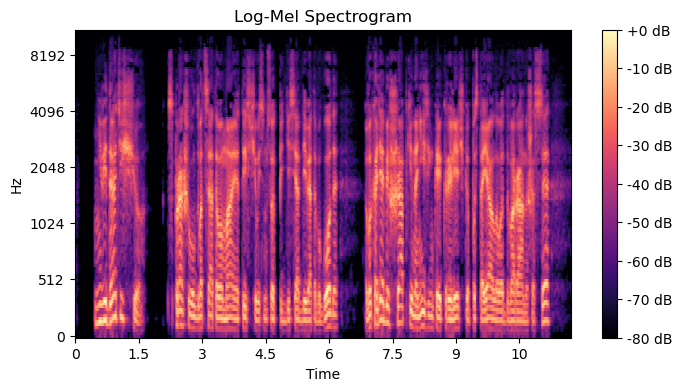

In [8]:

def compute_logmel_spectrogram(y, sr, n_mels=128, hop_length=512):
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, hop_length=hop_length)
    logmel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    return logmel_spectrogram
 
# Compute log-mel spectrogram
logmel_spectrogram = compute_logmel_spectrogram(y, sr=sr)
# librosa.export(y, format = 'wav')
# Display the log-mel spectrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(logmel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Mel Spectrogram')
plt.show()

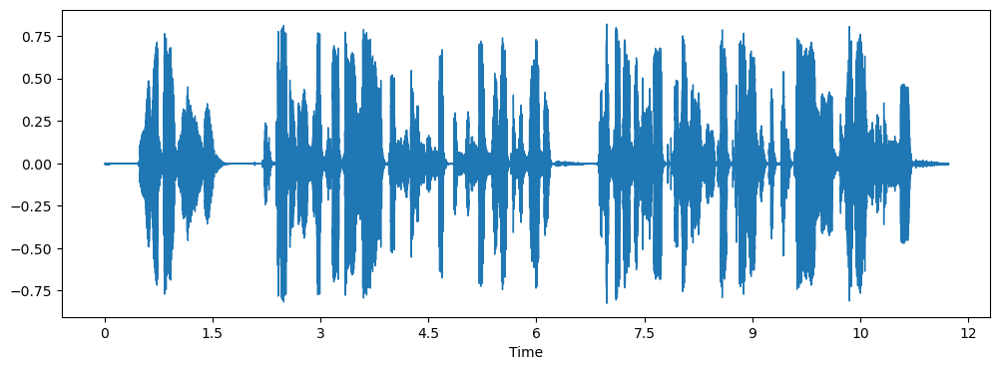

In [9]:
plt.figure(figsize=(12,4))
ld.waveshow(y, sr=sr)

Заметим, что на спектрограмме присутствуют высокие частоты, никак не влияющие на восприятие аудиозаписи, отфильтруем их так, чтобы частоты не превышали 4096 Гц

In [16]:
def butter_lowpass_filter(data, sample_rate, cutoff_freq = 4096, order=4):
    nyquist = 0.5 * sample_rate
    normal_cutoff = cutoff_freq / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    filtered_data = filtfilt(b, a, data)
    return filtered_data

In [17]:
filtered_y = filtered_audio = butter_lowpass_filter(y, sr)

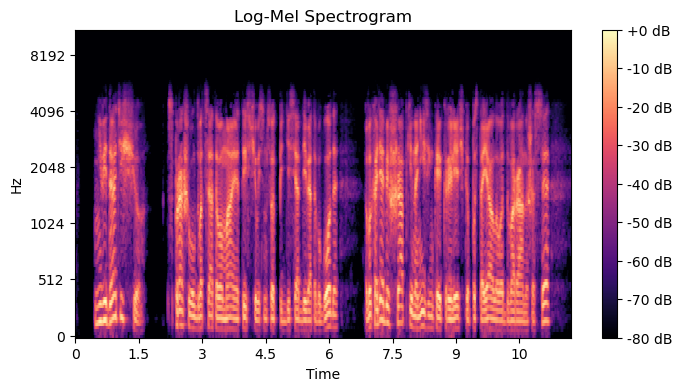

In [18]:

logmel_spectrogram = compute_logmel_spectrogram(filtered_y, sr=sr)
# librosa.export(y, format = 'wav')
# Display the log-mel spectrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(logmel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Mel Spectrogram')
plt.show()

Применим фильтрацию для каждого объекта

In [21]:
for i in range(0, 5219):
    y, sr = librosa.load(f'F:\\dataset\\chunk{i}.wav')
    filtered_y = filtered_audio = butter_lowpass_filter(y, sr)
    soundfile.write(f'F:\\filtered_dataset\\chunk{i}.wav', filtered_y, sr)

# 2. Создание транскрипции

Для того, чтобы считать датасет полным, необходимо создать транскрипции для каждого из объектов. Один из способов их созданий, это использование предобученных ASR моделей, целью которых является представление аудио сообщений в текстовом формате

## Подключение предобученной модели ASR

В этой работе будет использована ASR модель из библиотеки NEMO, в частности модель NVIDIA Conformer-Transducer Large (Russian)

In [3]:
asr_model = nemo_asr.models.EncDecRNNTBPEModel.from_pretrained("nvidia/stt_ru_conformer_transducer_large")
device = "cuda:0" if torch.cuda.is_available() else "cpu"
asr_model.to(device)

[NeMo I 2024-05-10 23:15:12 nemo_logging:381] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2024-05-10 23:15:13 nemo_logging:393] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    is_tarred: false
    tarred_audio_filepaths: null
    shuffle_n: 2048
    bucketing_strategy: synced_randomized
    bucketing_batch_size: null
    bucketing_weights: ''
    
[NeMo W 2024-05-10 23:15:13 nemo_logging:393] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 16
    shu

[NeMo I 2024-05-10 23:15:13 nemo_logging:381] PADDING: 0


[NeMo W 2024-05-10 23:15:13 nemo_logging:393] c:\Users\user\anaconda3\Lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
      warnings.warn("dropout option adds dropout after all but last "
    


[NeMo I 2024-05-10 23:15:13 nemo_logging:381] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.0, 'clamp': -1.0}
[NeMo I 2024-05-10 23:15:16 nemo_logging:381] Model EncDecRNNTBPEModel was successfully restored from C:\Users\user\.cache\huggingface\hub\models--nvidia--stt_ru_conformer_transducer_large\snapshots\687d02db291e931455cf321abd625ef2b7f0b1a9\stt_ru_conformer_transducer_large.nemo.


EncDecRNNTBPEModel(
  (preprocessor): AudioToMelSpectrogramPreprocessor(
    (featurizer): FilterbankFeatures()
  )
  (encoder): ConformerEncoder(
    (pre_encode): ConvSubsampling(
      (out): Linear(in_features=10240, out_features=512, bias=True)
      (conv): Sequential(
        (0): Conv2d(1, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
    (pos_enc): RelPositionalEncoding(
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (layers): ModuleList(
      (0-16): 17 x ConformerLayer(
        (norm_feed_forward1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (feed_forward1): ConformerFeedForward(
          (linear1): Linear(in_features=512, out_features=2048, bias=True)
          (activation): Swish()
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048,

Проверим работоспособность модели на примере

In [15]:
print(asr_model.transcribe(["F:\\dataset\\chunk1.wav"])[0][0])
sample = AudioSegment.from_wav('F:\\dataset\\chunk1.wav'); sample

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

не видать еще спрашивал двадцатого мая тысяча восемьсот пятьдесят девятого года выходя без шапки на низенькое крылечко постоялого двора на шоссе


Как видно модель отлично справляется с примером, оценим скорость выполнения транскрипции

In [16]:
start = time.time()
print(asr_model.transcribe(["F:\\dataset\\chunk1.wav"])[0][0])
end = time.time()
print(f'Время выполнения: {round(end - start, 2)} секунд')

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

не видать еще спрашивал двадцатого мая тысяча восемьсот пятьдесят девятого года выходя без шапки на низенькое крылечко постоялого двора на шоссе
Время выполнения: 0.32 секунд


Теперь оценим целесообразность использования ASR модели для транскрипции. Вычислим примерное время выполнения транскрипции всего датасета

In [14]:
print(f'Время выполнения всей транскрипции: {round(0.3*5219, 2)} секунд или {round(0.3*5219/60, 2)} минут')

Время выполнения всей транскрипции: 1565.7 секунд или 26.1 минут


Как видно, модель успеет создать текстовое представление аудиозаписей за адекватное время

Теперь создадим транскрипцию для каждого объекта датасета

In [ ]:
for i in range(0, 5219):
    text = asr_model.transcribe([f"F:\\dataset\\chunk{i}.wav"])[0][0]
    with open(f"F:\\target\\chunk{i}.txt", 'w') as f:
        f.write(text)

Просмотрев начало и конец транскрипции, заметим, что там присутствуют лишние объекты, которые попали в датасет, уберем их

# 3. Метрики качества модели

Для того, чтобы оценить качество полученного датасета, необходимо определить точность используемой ASR модели. Это невозможно сделать на основе обрабатываемого датасета, поэтому возьмем существующий с уже готовыми транскрипциями

Выберем датасет аудиозаписей произведения "Ариэль" Жаботинского. В силу того, что модель ASR не так быстро вычисляет транскрипции, ограничимся первыми 1000 объектами датасета 

In [5]:
data = []
with open('F:\\archive\\transcript.txt') as f:
    for line in f:
        line = line.split('|')
        line[3] = float(line[3])
        line[0] = "F:\\archive\\" + line[0]
        data.append(line)
data = list(map(lambda x: [x[0], x[1], x[3]], data))

In [6]:
df = pd.DataFrame(data, columns=['path', 'text', 'time'])
df = df[:1000]

Искомой метрикой возьмем WER - Word Error Rate. Она рассчитывается с помощью расстояния Левинштейна.

$WER = \frac{D}{N}$, где D - расстояние Левинштейна, а N - это количество слов в оригинальном слове.

Чем меньше расстояние Левинштейна, тем меньше числитель, тем меньше значение. Следовательно, чем меньше значение WER, тем лучше.

Для более комфортного представления метрики возьмем

$W_{accuaracy} = 1 - WER$

In [ ]:
from evaluate import load

wer_metric = load("wer")

import string
texts = []
transcriptions = []
for i in range(len(df)):
    path, text, time = df.iloc[i]
    text = text.translate(str.maketrans('', '', string.punctuation))
    transcription =  asr_model.transcribe([path])[0][0]
    texts.append(text.lower())
    transcriptions.append(transcription.lower())


wer = wer_metric.compute(references=texts, predictions=transcriptions)

word_accuracy = 1 - wer; word_accuracy

In [12]:
print('W accuracy =', round(word_accuracy*100, 2), '%')

W accuracy = 89.34 %


Исходя из Метрики точности модели, построенной на уже имеющихся данных, можно сделать вывод, что качество предобработанного датасета составляет примерно 89%. Изучив имеющиеся датасеты, предобработанные ASR моделями, можно сделать вывод, что качество транскрипции высокое. 

Пример датасетов Open_SST

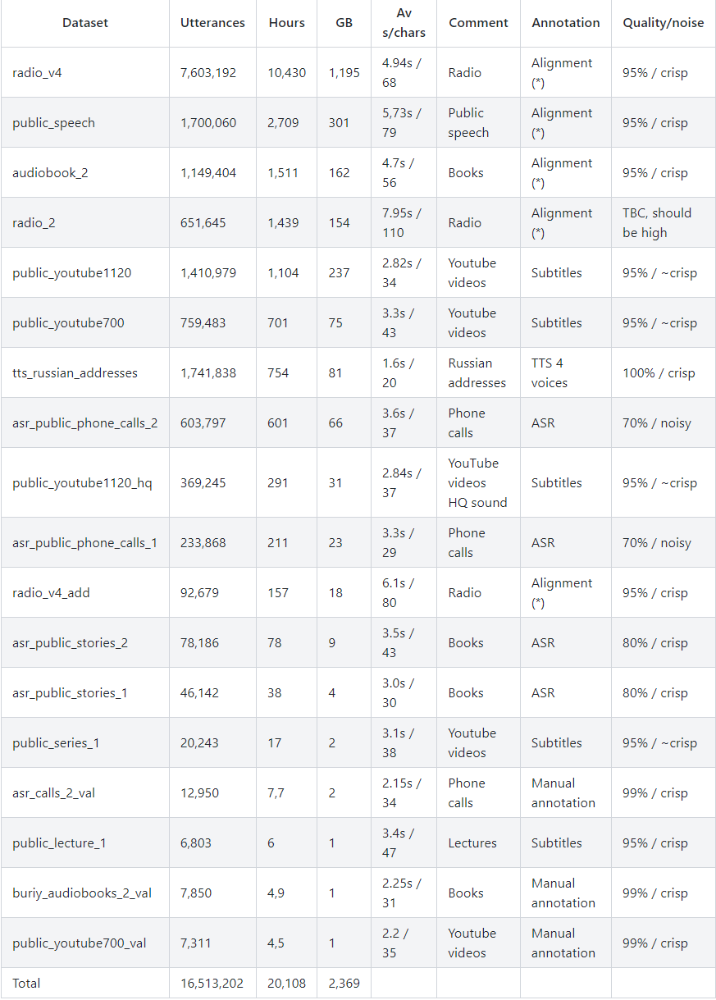

Заметим, что у датасетов с транскрипцией от ASR моделей качество составляет 70-80%

К сожалению, это не говорит о том, что данная модель наилучшая для предобработки данных, так как скорость выполнения слишком мала, для того, чтобы справиться с более чем 200 Гб имеющихся данных. Поэтому, в случае создания большего датасета, стоит выбрать лучшую в соотношении скорость/качество

# 4. Вывод

На основе проделанной работы и исследования, можно сделать вывод, что генерация, предобработка и фильтрация аудиоданных является обязательным и необходимым этапом для создания крупной ASR модели. Особенность использования заключается в том, что для того, чтобы предобучить крупную ASR модель, необходимо использовать более мелкие для генерации транскрипций текста, что может привести к некорым временным затратам. Но это необходимо сделать по причине того, что данные для обучаемой модели должны быть высокого качества, и желание сэкономить и сохранить время может привести к тому, что итоговый результат обучения на этих данных будет неудовлетворительным, что приведет к тому, что данные придется искать заново.